# **W1D2: Ocean-Atmosphere Reanalysis**

# Tutorial 1: Calculating ENSO with Xarray


**Week 1, Day 2, Ocean-Atmosphere Reanalysis**

**Content creators:** Abigail Bodner, Momme Hell, Aurora Basinski

**Content reviewers:** Katrina Dobson, Danika Gupta, Maria Gonzalez, Will Gregory, Nahid Hasan, Sherry Mi, Beatriz Cosenza Muralles, Ohad Zivan

**Content editors:** Yosemley Bermúdez

**Production editors:** Wesley Banfield, Jenna Pearson, Chi Zhang, Ohad Zivan

**Our 2023 Sponsors:** NASA TOPS

# ** Tutorial Objectives**

In this notebook (adapted from Project Pythia), we will practice using multiple tools to further examine SST temperature to further explore variations in the climate system that occur during El Nino and La Nina events. We will learn to:

1. Load Sea Surface Temprature data from the CESM2 model
2. Mask data using `.where()`
3. Compute climatologies and anomalies using `.groupby()`
4. Use `.rolling()` to compute moving average
5. Compute, normalize, and plot the Niño 3.4 Index

# Setup 


In [2]:
# @title imports the libraries we are going to use in this tutorial 

import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import xarray as xr
from pythia_datasets import DATASETS
import cartopy.io.shapereader as shapereader
import pandas as pd
import matplotlib.dates as mdates
import geoviews as gv
import geoviews.feature as gf

## Prerequisites


| Concepts | Importance | Notes |
| --- | --- | --- |
| [Introduction to Xarray](xarray-intro) | Necessary | |
| [Computation and Masking](computation-masking) | Necessary | |

In [3]:
# @title Video 1: Speaker Introduction
#Tech team will add code to format and display the video

# Section 1: Introduction to El Niño Southern Oscillation (ENSO)
During many of the tutorials yesterday, we practiced using Xarray packages to plot and interpret monthly global Sea Surface Temperature (SST) data from the Community Earth System Model v2 (CESM2). With this data, we:


*   Applied arithmetic and aggregation methods
*   Explored climatology
*   Computed climate anaomalies running averages
*   Masked data with one and multiple conditions 


During the final tutorial yesterday, we learned how to mask data using multiple conditions. In particular, we used `.where()` to isolate SST data between 5ºN-5ºS and 190ºW-240ºW. This geographic region, known as the Niño 3.4 region, is in the tropical Pacific Ocean and is commonly used as a metric for determining the phase of the El Niño-Southern Oscillation (ENSO). ENSO is a recurring climate pattern involving changes in SST in the central and eastern tropical Pacific Ocean, which has two alternating phases:

*    **El Niño:** the phase of ENSO characterized by warmer than average SSTs in the central and eastern tropical Pacific Ocean, weakened east to west equatorial winds and increased rainfall in the eastern tropical Pacific. 
*   **La Niña:** the phase of ENSO which is characterized by cooler than average SSTs in the central and eastern tropical Pacific Ocean, stronger east to west equatorial winds and decreased rainfall in the eastern tropical Pacific.

## Section 1.1: Tropical Pacific Climate Processes
To better understand the climate system processes that result in El Nino and La Nina events, let's first consider typical climate conditions in the tropical Pacific Ocean. Recall from W1D1, **trade winds** are winds that blow east to west just north and south of the equator (these are sometimes referred to as "easterly" winds since the winds are originating from the east and blowing toward the west). And as we discussed yesterday, the reason that the trade winds blow from east to west is related to Earth's rotation, which causes the winds in the Northern Hemisphere to curve to the right and winds in the Southern Hemisphere curves to the left. This is known as the **Coriolis effect**. 

If Earth's rotation affects air movement, do you think it also influences surface ocean water movement? It does! As trade winds blow across the tropical Pacific Ocean, they move water because of friction at the ocean surface. But because of the Coriolis effect, surface water moves to the right of the wind direction in the Northern Hemisphere and to the left of the wind direction in the Southern Hemisphere. However, the speed and direction of water movement changes with depth. Ocean surface water moves at an angle to the wind, and the water under the surface water moves at a slightly larger angle, and the water below that turns at an even larger angle. The average direction of all this turning water is about a right angle from the wind direction. This average is known as **Ekman transport**. Since this process is driven by the trade winds, the strength of this ocean water transport varies in response to changes in the the strength of the trade winds. 


## Section 1.2: Ocean-Atmosphere Interactions during El Niño and La Niña
So, how does all of this relate to El Niño and La Niña? Changes in the strength of Pacific Ocean trade winds and the resulting impact on Ekman transport create variations in the tropical Pacific Ocean SST, which further results in changes to atmospheric circulation patterns and rainfall.


During an El Niño event, ***easterly trade winds are weaker***. As a result, less warm surface water is  transported to the west via Ekman transport, which causes a build-up of warm surface water in the eastern equatorial Pacific. This creates warmer than avrage SSTs in the eastern equatorial Pacific Ocean. The atmosphere responds to this warming with increased rising air motion and above-average rainfall in the eastern Pacific. In contrast, during a La Niña event, ***easterly trade winds are stronger***. As a result, more warm surface water is transported to the west via Ekman transport, and cool water from deeper in the ocean rises up in the eastern Pacific during a process known as upwelling. This creates cooler than average SSTs in the eastern equatorial Pacific Ocean. This cooling decreases rising air movement in the eastern Pacific, resulting in drier than average cdonsitions. 


In this tutorial, we'll examine SST temperatures to further explore variations in the climate system that occur during El Nino and La Nina events. Specifically, we will plot and interpret CESM2 SST data from the Niño 3.4 region.

## Section 1.3: The Niño 3.4 Index
In this notebook, we are going to combine several topics we've covered so far to compute the [Niño 3.4 Index](https://climatedataguide.ucar.edu/climate-data/nino-sst-indices-nino-12-3-34-4-oni-and-tni) for the CESM2 submission for the [CMIP6 project](https://esgf-node.llnl.gov/projects/cmip6/). 

> Niño 3.4 (5N-5S, 170W-120W): The Niño 3.4 anomalies may be thought of as representing the average equatorial SSTs across the Pacific from about the dateline to the South American coast. The Niño 3.4 index typically uses a 5-month running mean, and El Niño or La Niña events are defined when the Niño 3.4 SSTs exceed +/- 0.4 ˚C for a period of six months or more.

> Nino X Index computation: (a) Compute area averaged total SST from Niño X region; (b) Compute monthly climatology (e.g., 1950-1979) for area averaged total SST from Niño X region, and subtract climatology from area averaged total SST time series to obtain anomalies; (c) Smooth the anomalies with a 5-month running mean; (d) Normalize the smoothed values by their standard deviation over the climatological period.

![](https://www.ncdc.noaa.gov/monitoring-content/teleconnections/nino-regions.gif)

At the end of this notebook, you should be able to produce a plot that looks similar to this [Oceanic Niño Index plot](https://climatedataguide.ucar.edu/sites/default/files/styles/extra_large/public/2022-03/indices_oni_2_2_lg.png):

![ONI index plot from NCAR Climate Data Guide](https://climatedataguide.ucar.edu/sites/default/files/styles/extra_large/public/2022-03/indices_oni_2_2_lg.png)

Open the SST and areacello datasets, and use Xarray's `merge` method to combine them into a single dataset:

In [4]:
SST_path = DATASETS.fetch('CESM2_sst_data.nc') # retrive (fetch) the SST data we are going to be working on
SST_data = xr.open_dataset(SST_path) # open the file we acquired with xarray

#remember that one degree spatial cell is not constant around the globe, each is a different size in square km. 
gridvars_path = DATASETS.fetch('CESM2_grid_variables.nc') # fetch the weighet for each grid cell
areacello_data = xr.open_dataset(gridvars_path).areacello # open and save only the gridcell weights.
ds_SST = xr.merge([SST_data, areacello_data]) # merge the SST and weights into one easy to use dataset - ds stands for dataset
ds_SST # allows us to view and interact with the datasets in the notebook.


/Users/chi/miniconda3/lib/python3.10/site-packages/xarray/conventions.py:427: SerializationWarning: variable 'tos' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  new_vars[k] = decode_cf_variable(


<xarray.Dataset>
Dimensions:    (time: 180, d2: 2, lat: 180, lon: 360)
Coordinates:
  * time       (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
  * lat        (lat) float64 -89.5 -88.5 -87.5 -86.5 ... 86.5 87.5 88.5 89.5
  * lon        (lon) float64 0.5 1.5 2.5 3.5 4.5 ... 356.5 357.5 358.5 359.5
Dimensions without coordinates: d2
Data variables:
    time_bnds  (time, d2) object ...
    lat_bnds   (lat, d2) float64 ...
    lon_bnds   (lon, d2) float64 ...
    tos        (time, lat, lon) float32 ...
    areacello  (lat, lon) float64 ...
Attributes: (12/45)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            CMIP
    branch_method:          standard
    branch_time_in_child:   674885.0
    branch_time_in_parent:  219000.0
    case_id:                972
    ...                     ...
    sub_experiment_id:      none
    table_id:               Omon
    tracking_id:            hdl:21.14100/2975ffd3-1d7b-47e3-961a-33f212ea4eb2
    variable_id:            tos
    variant_info:           CMIP6 20th century experiments (1850-2014) with C...
    variant_label:          r11i1p1f1

Visualize the first time point (eary 2000s - you can check this on the indexes->time from the ds_SST above):

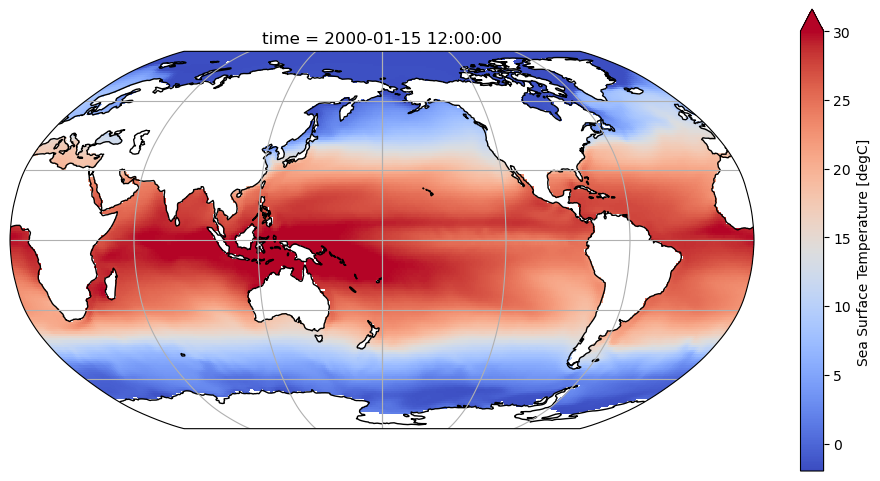

In [5]:
fig = plt.figure(figsize=(12, 6)) #define the plot size
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180)) # asssign axis and define the projection -  for a round plot
ax.coastlines() #add coastlines - this will issue a download warning
ax.gridlines() # add gridlines (lon and lat)
ds_SST.tos.isel(time=0).plot(
    ax=ax, transform=ccrs.PlateCarree(), vmin=-2, vmax=30, cmap='coolwarm'
) # plots the first time index (0) and define the temp range from -2 to 30C. cmap is the color map we choose

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
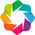

:HoloMap   [time]
   :Overlay
      .Image.I     :Image   [lon,lat]   (tos)
      .Coastline.I :Feature   [Longitude,Latitude]

In [6]:
# a bit more complicated code that allows interactive plots
gv.extension('bokeh') #load Bokeh
dataset_plot = gv.Dataset(ds_SST.isel(time=slice(0,10))) # slice only the first 10 timepoint, as it is a time consuming task 
images = dataset_plot.to(gv.Image, ['longitude', 'latitude'], 'tos', 'time')
images.opts(cmap='coolwarm', colorbar=True, width=600, height=400,projection=ccrs.Robinson()) * gf.coastline


## Section 1.4: Select the Niño 3.4 region 

There are a couple ways to select the Niño 3.4 region:

1. Use `sel()` or `isel()`


In [7]:
tos_nino34_op1 = ds_SST.sel(lat=slice(-5, 5), lon=slice(190, 240)) #slice the indexes
tos_nino34_op1

<xarray.Dataset>
Dimensions:    (time: 180, d2: 2, lat: 10, lon: 50)
Coordinates:
  * time       (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
  * lat        (lat) float64 -4.5 -3.5 -2.5 -1.5 -0.5 0.5 1.5 2.5 3.5 4.5
  * lon        (lon) float64 190.5 191.5 192.5 193.5 ... 236.5 237.5 238.5 239.5
Dimensions without coordinates: d2
Data variables:
    time_bnds  (time, d2) object ...
    lat_bnds   (lat, d2) float64 ...
    lon_bnds   (lon, d2) float64 ...
    tos        (time, lat, lon) float32 ...
    areacello  (lat, lon) float64 ...
Attributes: (12/45)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            CMIP
    branch_method:          standard
    branch_time_in_child:   674885.0
    branch_time_in_parent:  219000.0
    case_id:                972
    ...                     ...
    sub_experiment_id:      none
    table_id:               Omon
    tracking_id:            hdl:21.14100/2975ffd3-1d7b-47e3-961a-33f212ea4eb2
    variable_id:            tos
    variant_info:           CMIP6 20th century experiments (1850-2014) with C...
    variant_label:          r11i1p1f1

2. Use `where()` and select all values within the bounds of interest

In [8]:
tos_nino34_op2 = ds_SST.where(
    (ds_SST.lat < 5) & (ds_SST.lat > -5) & (ds_SST.lon > 190) & (ds_SST.lon < 240), drop=True
) # use dataset where function. use boolean commands
tos_nino34_op2

<xarray.Dataset>
Dimensions:    (time: 180, d2: 2, lat: 10, lon: 50)
Coordinates:
  * time       (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
  * lat        (lat) float64 -4.5 -3.5 -2.5 -1.5 -0.5 0.5 1.5 2.5 3.5 4.5
  * lon        (lon) float64 190.5 191.5 192.5 193.5 ... 236.5 237.5 238.5 239.5
Dimensions without coordinates: d2
Data variables:
    time_bnds  (time, d2, lat, lon) object 2000-01-01 00:00:00 ... 2015-01-01...
    lat_bnds   (lat, d2, lon) float64 -5.0 -5.0 -5.0 -5.0 ... 5.0 5.0 5.0 5.0
    lon_bnds   (lon, d2, lat) float64 190.0 190.0 190.0 ... 240.0 240.0 240.0
    tos        (time, lat, lon) float32 28.26 28.16 28.06 ... 28.54 28.57 28.63
    areacello  (lat, lon) float64 1.233e+10 1.233e+10 ... 1.233e+10 1.233e+10
Attributes: (12/45)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            CMIP
    branch_method:          standard
    branch_time_in_child:   674885.0
    branch_time_in_parent:  219000.0
    case_id:                972
    ...                     ...
    sub_experiment_id:      none
    table_id:               Omon
    tracking_id:            hdl:21.14100/2975ffd3-1d7b-47e3-961a-33f212ea4eb2
    variable_id:            tos
    variant_info:           CMIP6 20th century experiments (1850-2014) with C...
    variant_label:          r11i1p1f1

verify that `tos_nino34_op1` and `tos_nino34_op2` are the same by comparing the lat and lon indexes
let's choose one of them to continue working:

In [9]:
tos_nino34=tos_nino34_op2

let's use the same code we used to plot the whole earth, but now with the Niño 3.4 slice only

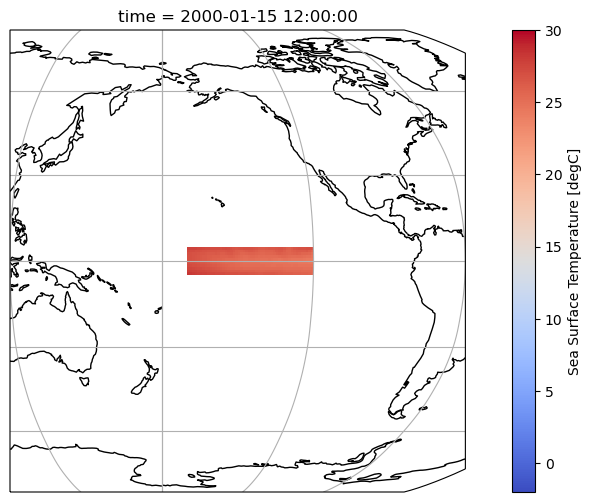

In [10]:
fig = plt.figure(figsize=(12, 6))# define the figure size
ax = plt.axes(projection=ccrs.Robinson(central_longitude=180)) #assign axis and projection 
ax.coastlines() #add coastlines
ax.gridlines() #add gridlines (lon and lat)
tos_nino34.tos.isel(time=0).plot(
    ax=ax, transform=ccrs.PlateCarree(), vmin=-2, vmax=30, cmap='coolwarm'
) # plot as above 
ax.set_extent((120, 300, 10, -10)) # make sure we see more areas of the earth and not only the square around Niño 3.4

## Section 1.5: Compute the anomalies

As mentioned above, the Niño 3.4 index is the difference of the running mean of several months. To achieve that, we first group by month and subtract the mean SST at each grid point in the Niño 3.4 region. We then correct with the weighted average over the region to obtain the Niño 3.4 index:

In [11]:
gb = tos_nino34.tos.groupby('time.month') # group the dataset by months
tos_nino34_anom = gb - gb.mean(dim='time')  # find the difference between each month to the total mean
index_nino34 = tos_nino34_anom.weighted(tos_nino34.areacello).mean(dim=['lat', 'lon']) # add cell weight correction
index_nino34 

<xarray.DataArray 'tos' (time: 180)>
array([-1.09020308, -0.94682967, -0.87016883, -0.67314585, -0.5896447 ,
       -0.42163336, -0.10459058,  0.03671597,  0.10723407,  0.17852156,
        0.03699042,  0.03701826,  0.18047588,  0.13209801,  0.18591603,
        0.23601154,  0.40335284,  0.41607815,  0.56452048,  0.7156873 ,
        0.94604362,  1.54824452,  1.64511465,  1.71039094,  1.68536348,
        1.59079585,  1.06137072,  0.42683035,  0.2822014 ,  0.01182273,
       -0.5027431 , -1.3148968 , -1.34690015, -1.74364298, -2.16279025,
       -2.25649865, -2.34426802, -2.36370228, -2.04569951, -2.06573353,
       -1.83853622, -1.44441815, -0.95012919, -0.29584977,  0.02383242,
        0.3042806 ,  0.42201278,  0.49855503,  0.48539388,  0.51069795,
        0.39988392,  0.32679846,  0.06415626, -0.1690822 ,  0.07204666,
        0.55496833,  0.65673461,  0.5782174 ,  0.65645894,  0.64569521,
        0.83701729,  0.75305043,  0.68472174,  0.4662565 ,  0.27632609,
       -0.16299999, -0.66729629, -0.97958271, -1.00201322, -1.34717395,
       -1.34564212, -1.5687706 , -1.43570687, -0.91709915, -0.60461387,
       -0.44474815, -0.39675868, -0.34406607, -0.19599502, -0.22287627,
       -0.27117918, -0.64625184, -0.58092383, -0.67215061, -0.69564109,
       -0.71416741, -0.51178699, -0.60251528, -0.50095791, -0.22583468,
       -0.02674855, -0.04463507, -0.11126017,  0.14102337,  0.30948326,
        0.28171994,  0.29325418,  0.38412105,  0.42648491,  0.75224678,
        1.00070394,  1.25250363,  1.52579141,  1.6265083 ,  1.62089045,
        1.74093504,  1.82211014,  2.04950726,  2.12185863,  1.92467521,
        1.41653584,  1.11950444,  0.51565087, -0.44916467, -1.6465778 ,
       -2.1730143 , -2.60500166, -2.81257114, -2.88834864, -2.78450974,
       -2.76460869, -2.71103108, -2.78661375, -2.20402372, -2.07531217,
       -1.83626326, -1.5576376 , -1.53099869, -1.38395769, -1.43226815,
       -1.52907286, -1.55885587, -1.0503494 , -0.66684357,  0.06911011,
        0.35993642,  0.32698893,  0.49531355,  0.58532673,  0.64840051,
        0.83827151,  1.0457816 ,  1.13088582,  1.39856505,  1.74717943,
        1.74436116,  1.53452864,  1.35453206,  1.6764909 ,  2.10747711,
        2.56691607,  2.78958849,  2.36954885,  2.26843067,  2.38747457,
        2.45266712,  2.80075557,  2.3257725 ,  1.7404829 ,  1.65213993,
        1.56080468,  1.18142005,  0.4727693 ,  0.02291108, -0.19411329,
       -0.45835799, -0.61915154, -0.69644116, -0.77052288, -1.04589789,
       -0.70015282, -0.70409144, -0.70546687, -0.41115267, -0.13565224,
        0.1670741 ,  0.35186849,  0.63483207,  0.71539744,  0.46310999])
Coordinates:
  * time     (time) object 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
    month    (time) int64 1 2 3 4 5 6 7 8 9 10 11 ... 2 3 4 5 6 7 8 9 10 11 12

Now, smooth the anomalies with a 5-month running mean:

In [12]:
index_nino34_rolling_mean = index_nino34.rolling(time=5, center=True).mean() # smooth using a 5month running mean

Text(0.5, 0, 'Year')

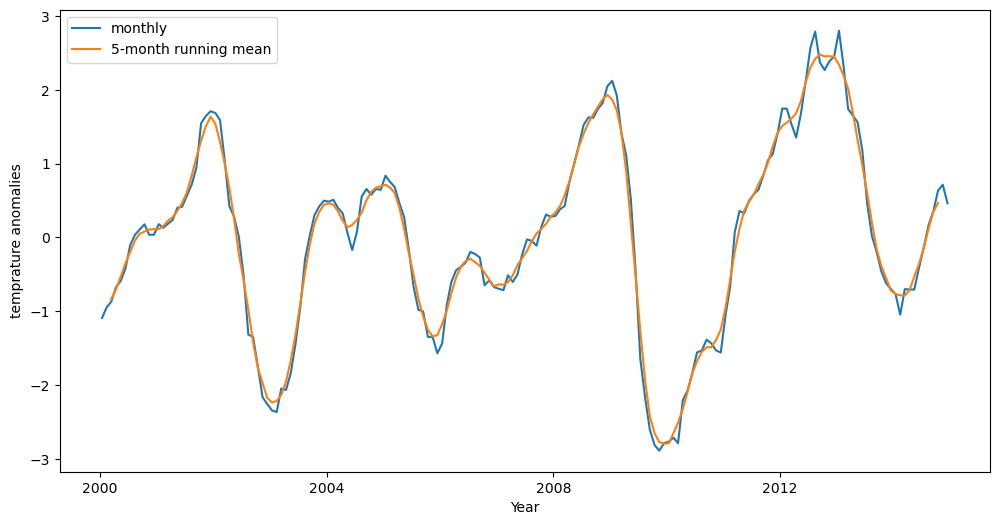

In [13]:
fig = plt.figure(figsize=(12, 6)) #define the plot size
ax = plt.axes() # assign axis
index_nino34.plot(ax=ax) # plot the monhtly data on the assigned axis
index_nino34_rolling_mean.plot(ax=ax) # plot the smoothed 5-monhtly data on the assigned axis
ax.legend(['monthly', '5-month running mean']) # add legend
ax.set_ylabel('temprature anomalies') #add ylabel
ax.set_xlabel('Year') #add xlabel




## Question 1.1:
Looking at the time series of SST anomaly over the Nino 3.4 region, how frequently do El Niño and La Niña events occur? 

In [28]:
# to_remove explanation

print ("""
Based on the monthly Sea Surface Temperature (SST) data from 2000 to 2014, it appears that both the El Niño and La Niña phases (exceed +/- 0.4 ˚C) occurred roughly 4 times each over this period.
""")


Based on the monthly Sea Surface Temperature (SST) data from 2000 to 2014, it appears that both the El Niño and La Niña phases (exceed +/- 0.4 ˚C) occurred roughly 4 times each over this period.



Compute the standard deviation of the SST in the Nino 3.4 region, over the entire time period of the data array:

In [22]:
std_dev = tos_nino34.tos.std().values #find the standard deviation for the whole original dataset
std_dev

array(1.8436452, dtype=float32)

Then we'll normalize the values by dividing the rolling mean by the standard deviation of the SST in the Niño 3.4 region:

In [23]:
normalized_index_nino34_rolling_mean = index_nino34_rolling_mean / std_dev 

# Section 2: Visualize the computed Niño 3.4 index

We will highlight values in excess of $\pm$0.5, roughly corresponding to El Niño (warm) and La Niña (cold) events.

Text(0.5, 1.0, 'Niño 3.4 Index')

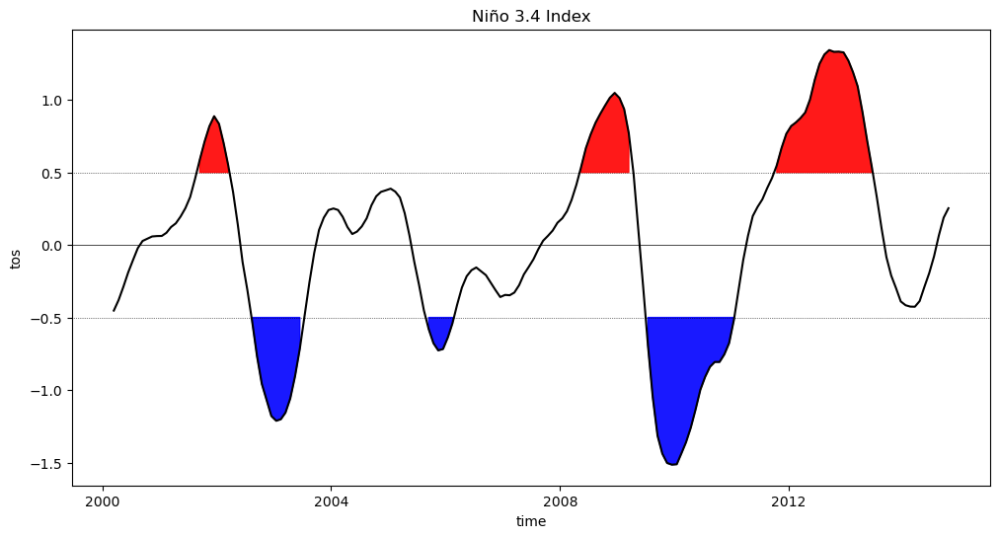

In [24]:
fig = plt.figure(figsize=(12, 6)) # assing figure size

plt.fill_between( #plot with color in between
    normalized_index_nino34_rolling_mean.time.data,  #x values
    normalized_index_nino34_rolling_mean.where(
        normalized_index_nino34_rolling_mean >= 0.5
    ).data, # top boundary - y values above 0.5
    0.5, # bottom boundary - 0.5
    color='red', #color
    alpha=0.9, #transperncy value
)
plt.fill_between(
    normalized_index_nino34_rolling_mean.time.data,
    normalized_index_nino34_rolling_mean.where(
        normalized_index_nino34_rolling_mean <= -0.5
    ).data,
    -0.5,
    color='blue',
    alpha=0.9,
)

normalized_index_nino34_rolling_mean.plot(color='black') #plot the smoothed data
plt.axhline(0, color='black', lw=0.5) # add a black line at x=0
plt.axhline(0.5, color='black', linewidth=0.5, linestyle='dotted') # add a black line at x=0.5
plt.axhline(-0.5, color='black', linewidth=0.5, linestyle='dotted') # add a black line at x=-0.5
plt.title('Niño 3.4 Index')

## Question 2.1: 
<!-- Sloane's ideas of climate content to add: -->
Now that we've normalized the data and highlighted SST anomalies that correspond to El Niño (warm) and La Niña (cold) events, consider the following questions:

- When were the strongest El Niño and La Niña events over this time period? 
- Considering the ocean-atmosphere interactions that cause El Nino and La Nina events, can you hypothesize potential reasons one El Nino or La Nina event may be stronger than others? 


In [27]:
# to_remove explanation

print ("""
1. The strongest El Niño occurred in 2012 and the strongest La Niña occurred in 2010. Both strongest events happened in more recent years.
2. El Niño and La Niña events are primarily driven by the interactions between the ocean and the atmosphere. Their strength is impacted by factors involved in ocean-atmosphere interactions such as ocean heat content, strength of trade winds, rainfall (as explained  in the video), causing one El Niño or La Niña event to be stronger than another.
""")


1. The strongest El Niño occurred in 2012 and the strongest La Niña occurred in 2010. Both strongest events happened in more recent years.
2. El Niño and La Niña events are primarily driven by the interactions between the ocean and the atmosphere. Their strength is impacted by factors involved in ocean-atmosphere interactions such as ocean heat content, strength of trade winds, rainfall (as explained  in the video), causing one El Niño or La Niña event to be stronger than another.



---

# Summary

We have applied a variety of Xarray's selection, grouping, and statistical functions to compute and visualize an important climate index. 

# Resources and References

- [Niño 3.4 index](https://climatedataguide.ucar.edu/climate-data/nino-sst-indices-nino-12-3-34-4-oni-and-tni)
- [Matplotlib's `fill_between` method](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.fill_between.html)
- [Matplotlib's `axhline` method](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.axhline.html) (see also its analogous `axvline` method)